In [7]:
import cv2
import numpy as np
from cellmask_model import CellMaskModel
import os
import matplotlib.pyplot as plt
from data import import_images
from statistics import mean

In [2]:
def get_encFeats_flat(model,image,type='cp'):
    pad_val = model.expand_div_256(image)[1]
    cp, mask, instance_mask, encFeats_cp, encFeats_mask = model.get_pred(image,0,encFeats=True)

    if type=='cp':
        encFeats = encFeats_cp
    elif type=='mask':
        encFeats = encFeats_mask

    encFeats_arr = []
    for enc in encFeats:
        arr = enc.detach()
        arr = np.expand_dims(arr,0)
        arr = np.expand_dims(arr,0)
        encFeats_arr.append(arr)

    stacked = model.stack_img(encFeats_arr,colrow=64)
    res = cv2.resize(stacked, dsize=(1280, 1280), interpolation=cv2.INTER_CUBIC)
    res = res[pad_val:-pad_val, pad_val:-pad_val]
    return res, instance_mask

def get_encFeats_flat_from_pred(instance_mask,encFeats,type='cp'):
    model = CellMaskModel()
    pad_val = model.expand_div_256(instance_mask)[1]

    encFeats_arr = []
    for enc in encFeats:
        arr = enc.detach()
        arr = np.expand_dims(arr,0)
        arr = np.expand_dims(arr,0)
        encFeats_arr.append(arr)

    stacked = model.stack_img(encFeats_arr,colrow=64)
    res = cv2.resize(stacked, dsize=(1280, 1280), interpolation=cv2.INTER_CUBIC)
    res = res[pad_val:-pad_val, pad_val:-pad_val]

    return res, instance_mask

def get_centers_of_ROIs(instance_mask):
    centers_instance_mask = []
    for i in range(1,max(instance_mask.flatten())+1):
        cell =  np.array(np.where(instance_mask == i,1,0))
        M = cv2.moments(np.float32(cell))
        center = (int(M["m10"] / M["m00"]),int(M["m01"] / M["m00"]))
        centers_instance_mask.append(center)
    return centers_instance_mask

def get_instance_encFeats_from_img(model,image,type='cp'):
    encFeats_flat, instance_mask = get_encFeats_flat(model,image,type=type)

    instance_encFeats = []
    for i in range(1,max(instance_mask.flatten())+1):
        instance_encFeats.append(np.delete(encFeats_flat,np.where(instance_mask.flatten()!=i)))

    cell_centers = get_centers_of_ROIs(instance_mask)
    return np.array(instance_encFeats), cell_centers

def get_instance_encFeats_from_encFeats(encFeats_flat,instance_mask,type='cp'):
    instance_encFeats = []
    for i in range(1,max(instance_mask.flatten())+1):
        first = instance_mask.flatten()
        second = encFeats_flat.flatten()
        mask = first == i
        rn = np.take(second, np.where(mask)[0])
        rn = np.extract(rn != 0, rn)
        instance_encFeats.append(rn)

    cell_centers = get_centers_of_ROIs(instance_mask)
    return np.array(instance_encFeats), cell_centers

def resize_arrays_to_fit_another(arrays_to_resize,array):
    arrays_shaped = []
    for i in arrays_to_resize:
        if i.shape < array.shape:
            pad_by = array.shape[0]-i.shape[0]
            new_arr = np.pad(i, (0, pad_by), 'mean')
            arrays_shaped.append(new_arr)
        elif i.shape > array.shape:
            arrays_shaped.append(i[:array.shape[0]])
        else:
            arrays_shaped.append(i)
    arrays_shaped = np.array(arrays_shaped)
    return arrays_shaped

def get_distance_between_cells(initial_cell_center,all_cell_centers):
    center_distances = []
    a = np.array(initial_cell_center)
    for cell_center in all_cell_centers:
        b = np.array(cell_center)
        center_distances.append(np.linalg.norm(a-b))
    return center_distances

def get_matching_cells(initial_cell,all_cells,cell_distances,radius=1000):
    all_cells_shaped = resize_arrays_to_fit_another(all_cells,initial_cell)
    cos_sim = np.dot(initial_cell, all_cells_shaped.T)/(np.linalg.norm(all_cells_shaped)*np.linalg.norm(initial_cell))

    #use the radius to limit the possible cells,
    #maybe input into the function an array of all the cells but just their distance to the others
    cell_distances = np.array(cell_distances)
    possible_matches = np.where(cell_distances < radius,cos_sim,0)

    match_index = np.argmax(possible_matches)
    #return idnex of max value in possible_matches

    return match_index

def get_matching_cells_averaged_cp_mask(initial_cell_enc_cp, initial_cell_enc_mask, all_cells_enc_cp, all_cells_enc_mask, cell_distances, radius=1000):
    all_cells_enc_cp_shaped = resize_arrays_to_fit_another(all_cells_enc_cp,initial_cell_enc_cp)
    all_cells_enc_mask_shaped = resize_arrays_to_fit_another(all_cells_enc_mask,initial_cell_enc_mask)

    cos_sim_cp = np.dot(initial_cell_enc_cp, all_cells_enc_cp_shaped.T)/(np.linalg.norm(all_cells_enc_cp_shaped)*np.linalg.norm(initial_cell_enc_cp))
    cos_sim_mask = np.dot(initial_cell_enc_mask, all_cells_enc_mask_shaped.T)/(np.linalg.norm(all_cells_enc_mask_shaped)*np.linalg.norm(initial_cell_enc_mask))
    cos_sim_avg = (cos_sim_cp+cos_sim_mask)/2

    cell_distances = np.array(cell_distances)
    possible_matches = np.where(cell_distances < radius, cos_sim_avg, 0)
    possible_matches_distance = np.where(possible_matches != 0, cell_distances, 0)
    match_index = np.argmax(possible_matches)

    return cos_sim_avg, possible_matches, possible_matches_distance

#make the above a function

def get_both_encfeats(model,images):
    cps, masks, instance_masks, encFeats_cps, encFeats_masks = model.eval(images,0,encFeats=True)
    
    instance_encFeats_cps = []
    instance_encFeats_masks = []
    distance_between_cells  = []

    for i in range(len(instance_masks)):
        print(i)
        encFeats_cp_flat_0, instance_mask_0 = get_encFeats_flat_from_pred(instance_masks[i],encFeats_cps[i]) #cp enc
        instance_encFeats_cp, cell_centers_0 = get_instance_encFeats_from_encFeats(encFeats_cp_flat_0,instance_masks[i],type='cp')
        instance_encFeats_cps.append(instance_encFeats_cp)

        encFeats_mask_flat_0, instance_mask_0 = get_encFeats_flat_from_pred(instance_masks[i],encFeats_masks[i]) #mask enc
        instance_encFeats_mask_0, cell_centers_0 = get_instance_encFeats_from_encFeats(encFeats_mask_flat_0,instance_masks[i],type='mask')
        instance_encFeats_masks.append(instance_encFeats_mask_0)

        if i != len(instance_masks)-1:
            distance_between_each_cells_and_next_img = []
            cell_centers_next_img = get_centers_of_ROIs(instance_masks[i+1])

            for j in range(len(cell_centers_0)):
                if j %20 == 0:
                    print('j:',j)
                distance_between_each_cells_and_next_img.append(get_distance_between_cells(cell_centers_0[j],cell_centers_next_img))

            distance_between_cells.append(distance_between_each_cells_and_next_img)

    return instance_encFeats_cps, instance_encFeats_masks, distance_between_cells, instance_masks

def get_possible_matches(instance_masks,encFeats_cps,encFeats_masks):

    encFeats_cp_flat_0, instance_mask_0 = get_encFeats_flat_from_pred(instance_masks[0],encFeats_cps[0]) #cp enc
    encFeats_mask_flat_0, instance_mask_0 = get_encFeats_flat_from_pred(instance_masks[0],encFeats_masks[0]) #mask enc
    instance_encFeats_cp_0, cell_centers_0 = get_instance_encFeats_from_encFeats(encFeats_cp_flat_0,instance_masks[0],type='cp')
    instance_encFeats_mask_0, cell_centers_0 = get_instance_encFeats_from_encFeats(encFeats_mask_flat_0,instance_masks[0],type='mask')

    encFeats_cp_flat_1, instance_mask_1 = get_encFeats_flat_from_pred(instance_masks[1],encFeats_cps[1]) #cp enc
    encFeats_mask_flat_1, instance_mask_1 = get_encFeats_flat_from_pred(instance_masks[1],encFeats_masks[1]) #mask enc
    instance_encFeats_cp_1, cell_centers_1 = get_instance_encFeats_from_encFeats(encFeats_cp_flat_1,instance_masks[1],type='cp')
    instance_encFeats_mask_1, cell_centers_1 = get_instance_encFeats_from_encFeats(encFeats_mask_flat_1,instance_masks[1],type='mask')

    distance_between_cells_from_first = get_distance_between_cells(cell_centers_0[0],cell_centers_1)
    possible_matches, possible_matches_distance = get_matching_cells_averaged_cp_mask(instance_encFeats_cp_0[0], instance_encFeats_mask_0[0], instance_encFeats_cp_1, instance_encFeats_mask_1, distance_between_cells_from_first, radius=400)

    return possible_matches

#here we give the encFeat instances of two images to find all the possible matching cells from the first image to the second
# Input: instance encFeats first image, instance encFeats second image
# Output: list of list of the matches of each cells
def get_possible_matches_for_all_cells_in_image(instance_encFeats_cp_first, instance_encFeats_mask_first, instance_encFeats_cp_second, instance_encFeats_mask_second, distance_between_cells_first_to_second, radius=100):
    #have to loop over every cell
    possible_matches_list = []
    possible_matches_distances_list = []
    for i in range(len(instance_encFeats_cp_first)):
        possible_matches, possible_matches_distance = get_matching_cells_averaged_cp_mask(instance_encFeats_cp_first[i],instance_encFeats_mask_first[i],instance_encFeats_cp_second,instance_encFeats_mask_second,distance_between_cells_first_to_second[i],radius=radius)
        possible_matches_list.append(possible_matches)
        possible_matches_distances_list.append(possible_matches_distance)
    return possible_matches_list, possible_matches_distances_list

#possible_matches is a list of list, each list containes probabilities, they correspond to the probability that each cell in the second image correspond to the first
#for example [0,0.5,0] means there are 3 cells in the second image, and that the cell from the first image with those probabilities has a 0.5 probability of being matched to the cell 2 in the 2nd image
#so possible_matches has a lenght of 230, it holds 230 lists, which is the number of cells in the first image, and each cell has a probability for each of the 257 cells in the second image
#so max_index is the number of cells in the second image, this will be useful to loop through each of these cells in the second image to find them a match from the first image
#cells_from_first_img_matches holds 230 "-1" in a list which coresponds to the number of cells in the 1st image and will be replaced by their possible matches
#the loop goes through the indexes of the cell in the second images
#for each cell index, it goes through the list of possible_matches and checks if that index appears in them, and if it does, it is appended in
def sort_possible_matches(possible_matches):
    max_index = max(np.argmax(np.array(possible_matches) > 0, axis=1)) #find the last index of the second image to loop through them

    cells_from_first_img_matches = [-1 for i in range(len(possible_matches))]

    for i in range(0,max_index):
        cell_index = []
        cell_score = []
        for j in range(len(possible_matches)):
            if i in np.where(possible_matches[j] > 0)[0]: #the cell in the first image does have cell i (from the second image) as a contender for a match
                cell_index.append(j)
                cell_score.append(possible_matches[j][i])
        if len(cell_index) > 0:
            cells_from_first_img_matches[cell_index[np.argmax(cell_score)]] = i
    
    return cells_from_first_img_matches

def get_centers_per_instance_mask(instance_masks):
    centers_per_instance_mask = []
    for instance_mask in instance_masks:
        centers_per_instance_mask.append(get_centers_of_ROIs(instance_mask))
    return centers_per_instance_mask

def get_final_matches(instance_encFeats_cps,instance_encFeats_masks,distance_between_cells,radius=100):
    final_matches = [] #list of list of matches from image i to image i+1
    possible_matches_lists = []
    possible_matches_distances_lists = []
    for i in range(0,len(instance_encFeats_cps)-1):
        possible_matches_list, possible_matches_distances_list = get_possible_matches_for_all_cells_in_image(instance_encFeats_cps[i],instance_encFeats_masks[i],instance_encFeats_cps[i+1],instance_encFeats_masks[i+1],distance_between_cells[i],radius=radius)
        final_matches.append(sort_possible_matches(possible_matches_list))
        possible_matches_lists.append(possible_matches_list)
        possible_matches_distances_lists.append(possible_matches_distances_list)
    return final_matches, possible_matches_lists, possible_matches_distances_lists

def get_matching_indexes(final_matches):
    indexes_all = []
    for j in range(len(final_matches[0])):
        indexes = []
        for i in range(len(final_matches)):
            if i == 0:
                #indexes.append(final_matches[i][j])
                indexes.append(j)
            else:
                indexes.append(final_matches[i][indexes[i-1]])
        indexes_all.append(indexes)
    return indexes_all

def get_matching_indexes_distances(matching_indexes,distance_between_cells):
    matching_indexes_distances = []
    for matching_index_array in matching_indexes:
        distances = [0]
        for i in range(len(matching_index_array)-1):
            try:
                distances.append(distance_between_cells[i][matching_index_array[i]][matching_index_array[i+1]])
            except:
                distances.append(-1)
                
        matching_indexes_distances.append(distances)
    return np.array(matching_indexes_distances)

def display_results(final_matches,centers_per_instance_mask,instance_masks,distance_between_cells,images,num_masks=None,crop_val=20,max_indexes=200):
    if num_masks == None:
        num_masks = len(instance_masks)

    num_images = len(instance_masks)
    if max_indexes > len(final_matches[0]):
        max_indexes == len(final_matches[0])

    for i in range(0,max_indexes):
        found_indexes = []

        for j in range(num_masks):
            pad_val = 20
            image = np.pad(images[j], pad_val, mode='constant')

            plt.subplot(1,num_images,j+1)

            if j == 0:
                index = i
                plt.gca().set_title(str(index)+'\n'+str(0))
            else:
                old_index = np.copy(index)
                index = final_matches[j-1][old_index]
                
                #old_cell_xy = centers_per_instance_mask[j][old_index] #xy position of cell from before
                #xy position of cell from now
                
                plt.gca().set_title(str(index) + '\n' + str(int(distance_between_cells[j-1][old_index][index]))) 
            
            #plt.gca().set_title(str(index) + '\n' + str(centers_per_instance_mask[j][i][0]) + ' ' + str(centers_per_instance_mask[j][i][1]))
            found_indexes.append(index)
            
            x1 = centers_per_instance_mask[j][index][0]+pad_val
            y1 = centers_per_instance_mask[j][index][1]+pad_val
            plt.imshow(image[y1-crop_val:y1+crop_val,x1-crop_val:x1+crop_val])

            plt.axis('off')
            
        
        if found_indexes.count(-1) == 0:
            plt.show()
        else:
            #plt.clf()
            plt.ioff()

In [3]:
model = CellMaskModel()
model.import_model(os.getcwd() + '/saved_weights/cp_model', os.getcwd() + '/saved_weights/mask_model')

images_path_1059 = os.getcwd() + '/images_1059_0/'
images_1059 = import_images(images_path_1059,normalisation=True,num_imgs=20,format='.tiff')

In [18]:
cps, masks, instance_masks, encFeats_cps_list, encFeats_masks = model.eval(images_1059[:2],0,encFeats_list=True)

centers_per_instance_mask = get_centers_per_instance_mask(instance_masks)

iofhef
xxx 25
iofhef
xxx 25


In [5]:
def get_cells_encfeats(image):
    cps, masks, instance_masks, encFeats_cps_list, encFeats_masks = model.eval(image,0,encFeats_list=True)

    encFeats = np.squeeze(np.array(encFeats_cps_list))
    pad_val = model.expand_div_256(instance_masks[0])[1]
    image_at_each_channel_flat = []
    for i in range(64):
        currrent_channel = []
        for j in range(25):
            currrent_channel.append(encFeats[j][i])
        stacked = model.stack_img(currrent_channel,colrow=64)
        stacked_resiszed = cv2.resize(stacked, dsize=(1280, 1280), interpolation=cv2.INTER_CUBIC)
        stacked_cropped = stacked_resiszed[pad_val:-pad_val, pad_val:-pad_val]
        stacked_flat = stacked_cropped.flatten()
        image_at_each_channel_flat.append(stacked_flat)

    instance_encfeats_per_channel = []
    for i in range(64):
        instance_at_channel, cell_centers = get_instance_encFeats_from_encFeats(image_at_each_channel_flat[i],instance_masks[0])
        instance_encfeats_per_channel.append(instance_at_channel)
        
    cells_encfeats = []
    for i in range(len(instance_encfeats_per_channel[0])): #iterate by the number of cells
        current_cell = []
        for j in range(len(instance_encfeats_per_channel)): #iterate through channels
            current_cell.append(instance_encfeats_per_channel[j][i])
        cells_encfeats.append(current_cell)

    return cells_encfeats

In [22]:
def get_cos_sims(cells_encfeats_1,cells_encfeats_2):
    cos_sims_per_cells_in_first_img = []
    for cell1 in cells_encfeats_1:
        cos_sims_for_cell1 = []
        for cell2 in cells_encfeats_2:
            cos_sim_list_cell2 = []
            for i in range(len(cell1)): #iterate through the channels
                cell1_at_channel = cell1[i]
                cell2_at_channel = cell2[i]
                #pad the smallest with its average value to match the value of the longest
                if len(cell1_at_channel) > len(cell2_at_channel):
                    cell2_at_channel = resize_arrays_to_fit_another([cell2_at_channel],cell1_at_channel)[0]
                elif len(cell2_at_channel) > len(cell1_at_channel):
                    cell1_at_channel = resize_arrays_to_fit_another([cell1_at_channel],cell2_at_channel)[0]

                cos_sim = np.dot(cell1_at_channel, cell2_at_channel.T)/(np.linalg.norm(cell2_at_channel)*np.linalg.norm(cell1_at_channel))
                cos_sim_list_cell2.append(cos_sim)
            cos_sim_avg_cell2 = mean(cos_sim_list_cell2)
            cos_sims_for_cell1.append(cos_sim_avg_cell2)
        cos_sims_per_cells_in_first_img.append(cos_sims_for_cell1)
    return cos_sims_per_cells_in_first_img

def find_largest_number_index(lst_of_lst):
    arr = np.array(lst_of_lst)
    index = np.unravel_index(np.argmax(arr), arr.shape)
    return [index[0], index[1]]

def zero_out_index(lst, idx):
    """
    Takes a list of lists and an index number. Returns a new list of lists where the value at the index number of each list has been turned to 0.
    """
    new_lst = []
    for sub_lst in lst:
        sub_lst[idx] = 0
        new_lst.append(sub_lst)
    return new_lst

#make this numpy at some point
def zero_out_sublist(list_of_lists, index):
    """
    Takes a list of lists and an index number that corresponds to a list, and returns the
    list of lists where the list at that index number only holds zeros.
    
    Args:
        list_of_lists (list): A list of lists.
        index (int): The index number of the list to zero out.
    
    Returns:
        list: A new list of lists where the list at the specified index number
        holds only 0s.
    """
    new_list_of_lists = []
    
    for i, sublist in enumerate(list_of_lists):
        if i == index:
            new_sublist = [0] * len(sublist)
        else:
            new_sublist = sublist.copy()
        new_list_of_lists.append(new_sublist)
    
    return new_list_of_lists

def get_cell_pairs(cos_sims_per_cells_in_first_img,center_first_image,centers_second_image,radius = 20):
    list_of_pairs = []
    cos_sims = []

    for i in range(len(cos_sims_per_cells_in_first_img)):
        for j in range(len(cos_sims_per_cells_in_first_img[0])):
            first_cell_coor = np.array(center_first_image[i])
            second_cell_coor = np.array(centers_second_image[j])
            distance = np.linalg.norm(first_cell_coor-second_cell_coor)
            if distance > radius:
                cos_sims_per_cells_in_first_img[i][j] = 0
                #continue

    for i in range(len(cos_sims_per_cells_in_first_img[0])):
        list_with_large_value_index, large_value_index = find_largest_number_index(cos_sims_per_cells_in_first_img) #[index of list with large value, index of large value inside of its list]
        #print(list_with_large_value_index,large_value_index)
        if cos_sims_per_cells_in_first_img[list_with_large_value_index][large_value_index] <= 0:
            continue
        #new_pair = [ index of list that holds the max value , index of max_value in that list ]
        new_pair = [list_with_large_value_index, large_value_index]
        cos_sims.append(cos_sims_per_cells_in_first_img[list_with_large_value_index][large_value_index])
        list_of_pairs.append(new_pair)
        #in all the remaining list in cos_similarities_of_each_cell, at the index of the max_value of that cell, change to 0
        cos_sims_per_cells_in_first_img = zero_out_index(cos_sims_per_cells_in_first_img,large_value_index)
        cos_sims_per_cells_in_first_img = zero_out_sublist(cos_sims_per_cells_in_first_img,list_with_large_value_index)
    return list_of_pairs

In [6]:
cells_encfeats_1 = get_cells_encfeats(images_1059[0])
cells_encfeats_2 = get_cells_encfeats(images_1059[1])

iofhef
xxx 25


C:\Users\rz200\AppData\Local\Temp\ipykernel_22144\195428500.py:69: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(instance_encFeats), cell_centers


iofhef
xxx 25


In [10]:
cos_sims = get_cos_sims(cells_encfeats_1,cells_encfeats_2)

In [23]:
cell_pairs = get_cell_pairs(cos_sims,centers_per_instance_mask[0],centers_per_instance_mask[1],radius=20)

0
2
70 76


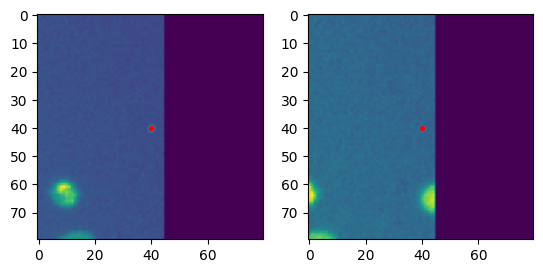

1
2
68 73


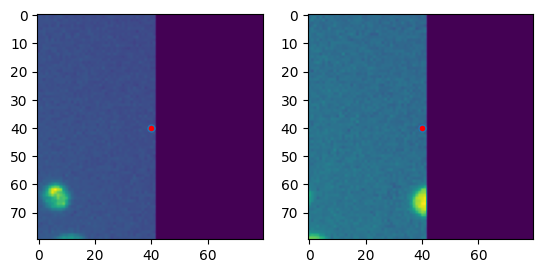

2
2
78 84


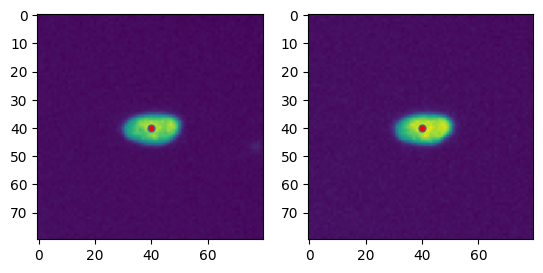

3
2
174 173


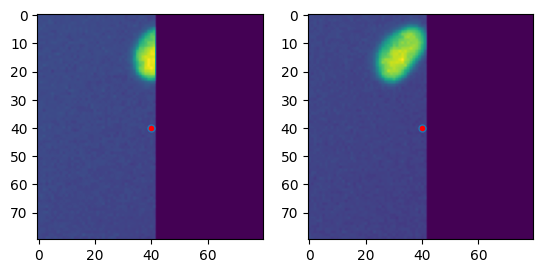

4
2
154 149


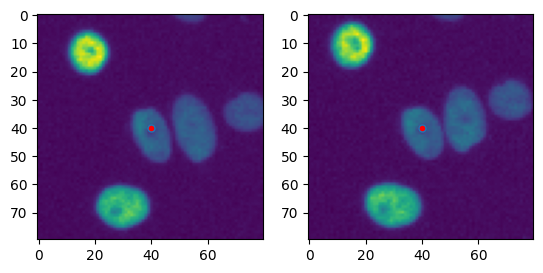

5
2
88 89


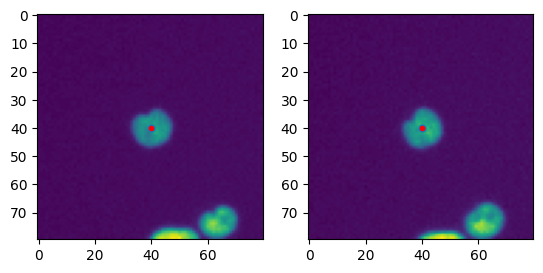

6
2
50 54


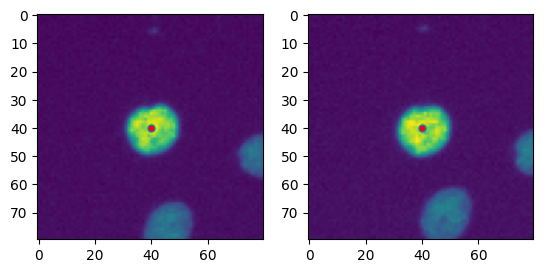

7
2
54 56


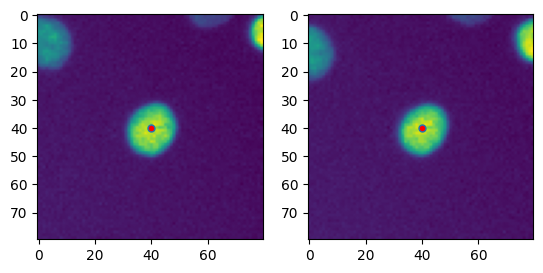

8
2
173 174


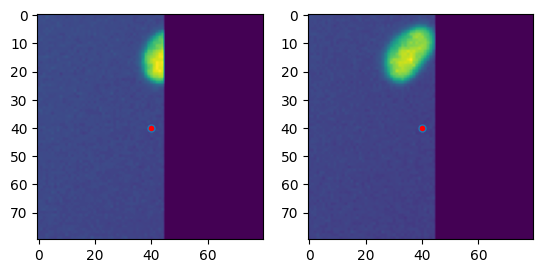

9
2
107 107


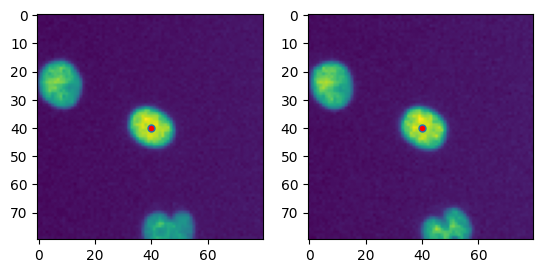

10
2
179 179


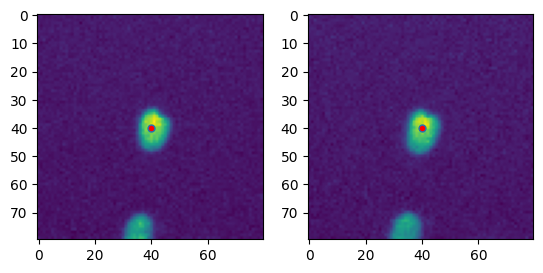

11
2
144 141


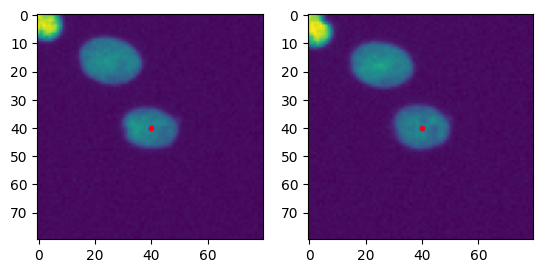

12
2
131 131


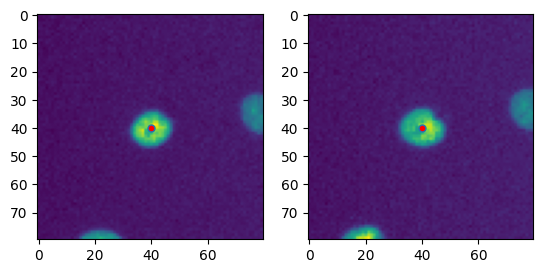

13
2
13 15


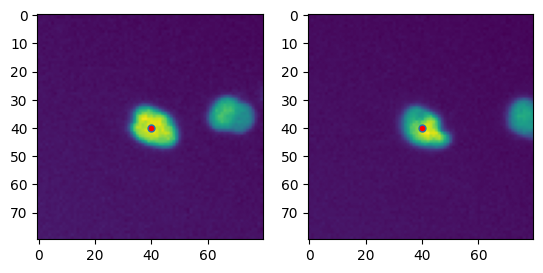

14
2
27 25


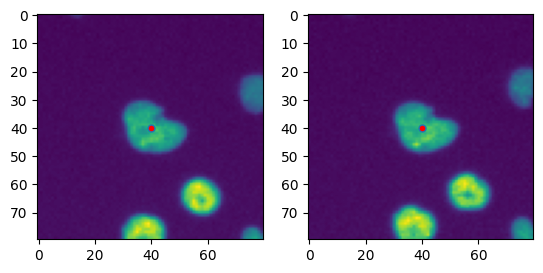

15
2
143 140


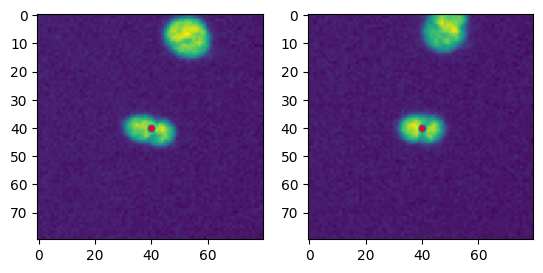

16
2
23 22


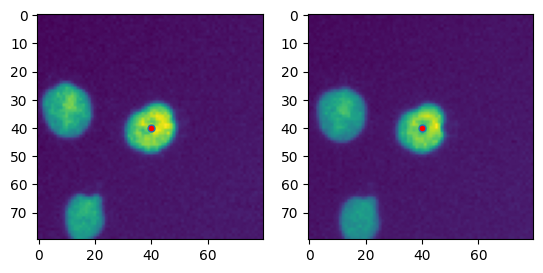

17
2
168 166


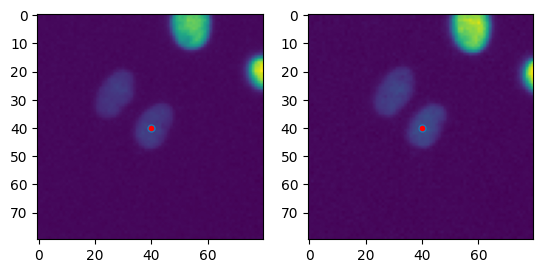

18
2
52 55


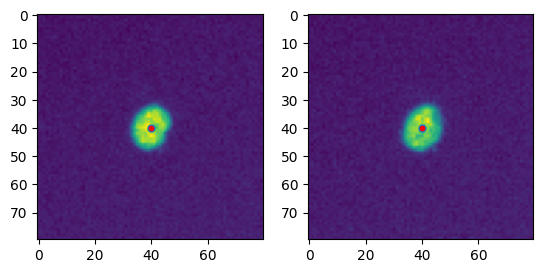

19
2
58 63


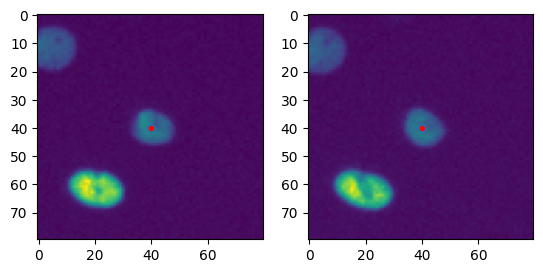

20
2
150 147


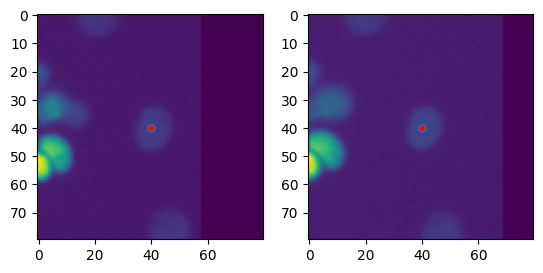

21
2
169 164


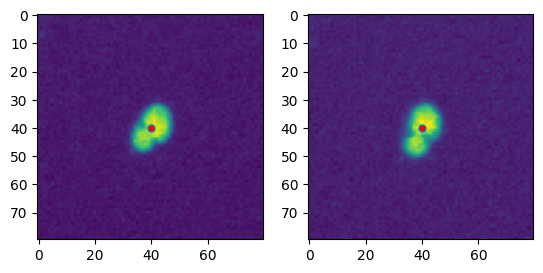

22
2
185 185


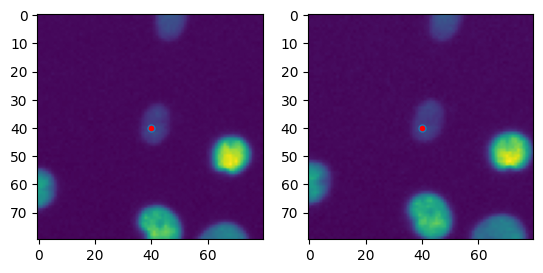

23
2
161 154


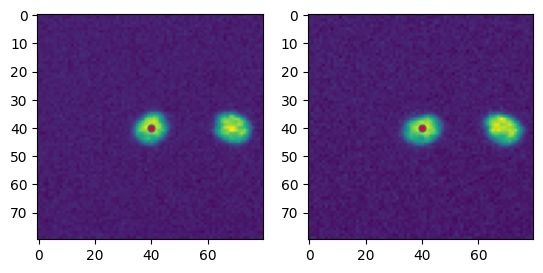

24
2
89 91


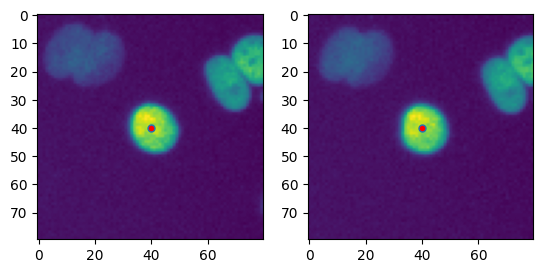

25
2
37 34


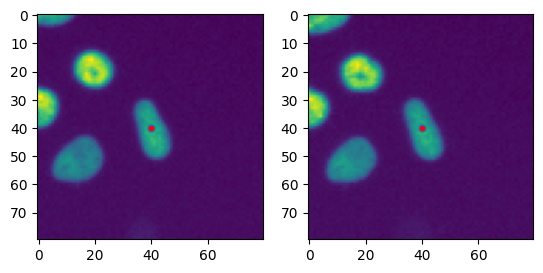

26
2
166 160


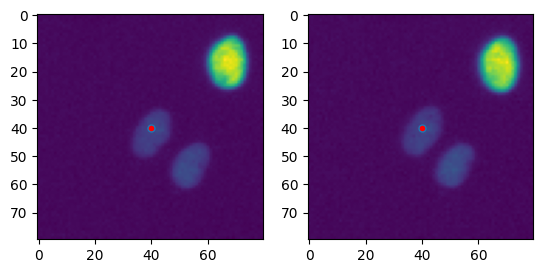

27
2
33 31


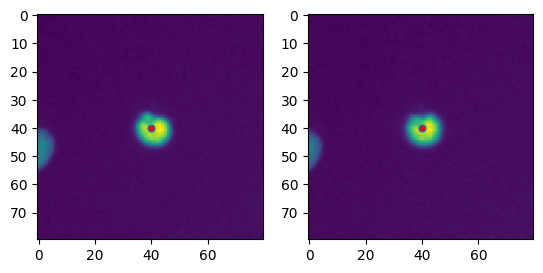

28
2
109 109


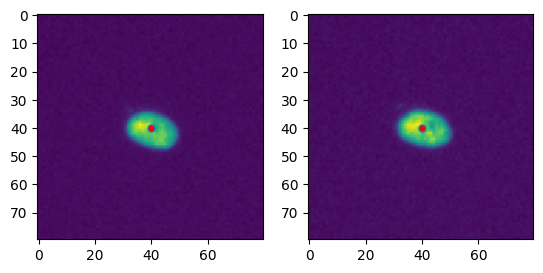

29
2
138 136


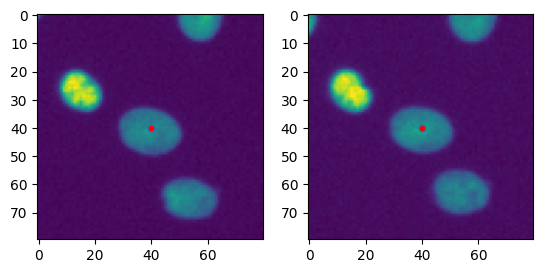

30
2
112 112


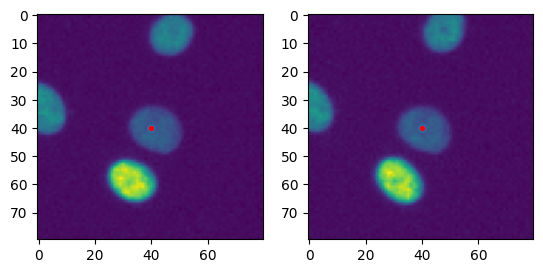

31
2
104 105


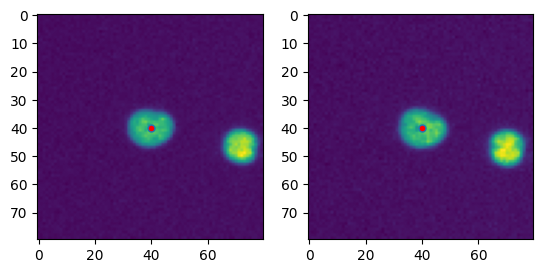

32
2
63 67


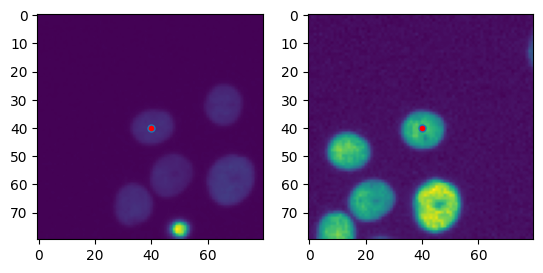

33
2
141 138


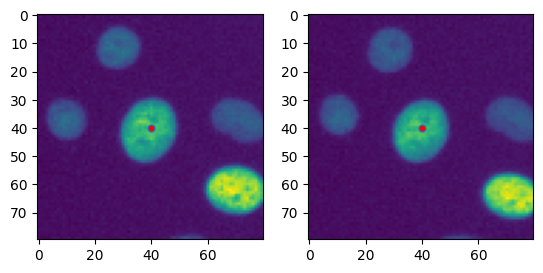

34
2
105 106


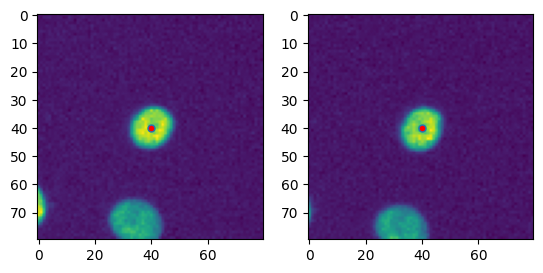

35
2
188 188


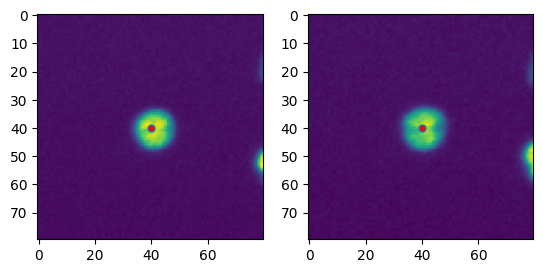

36
2
95 97


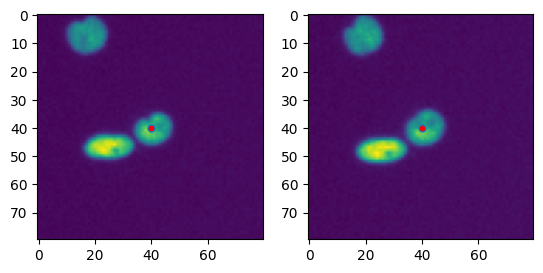

37
2
116 116


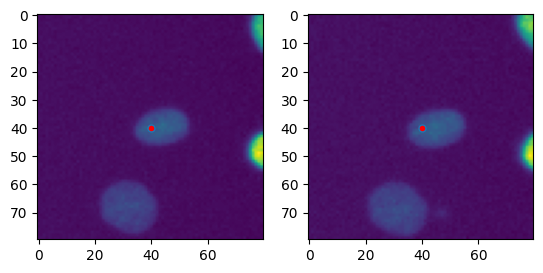

38
2
197 195


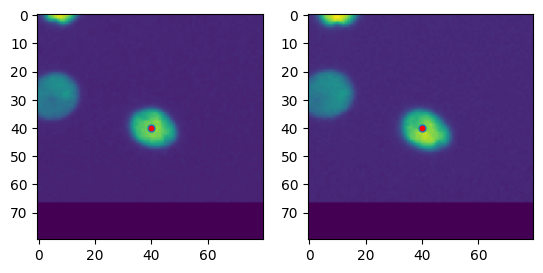

39
2
1 2


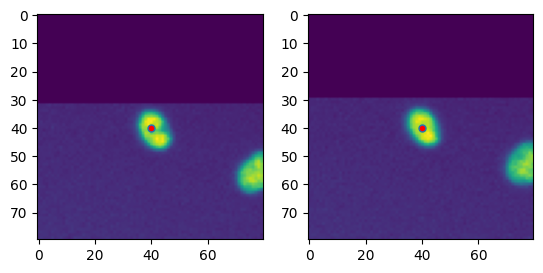

40
2
167 162


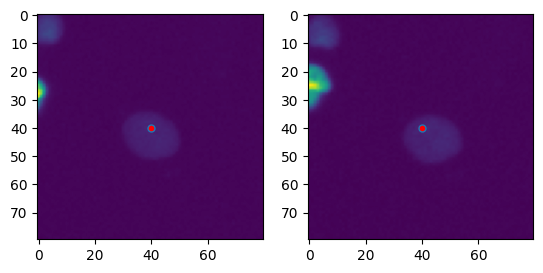

41
2
133 132


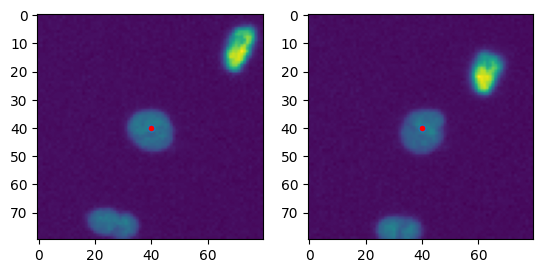

42
2
18 20


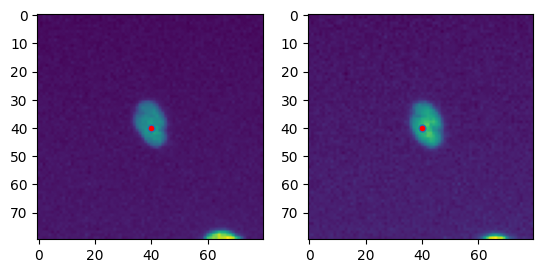

43
2
137 135


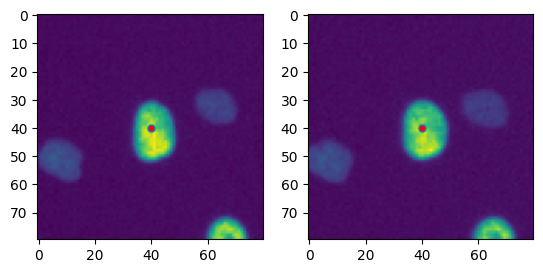

44
2
79 85


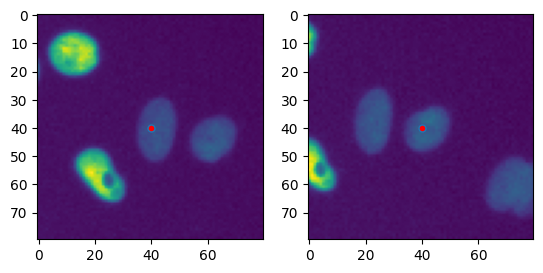

45
2
34 32


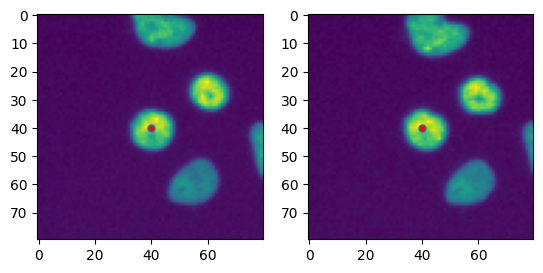

46
2
98 99


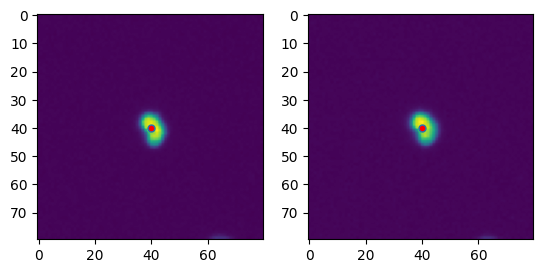

47
2
42 43


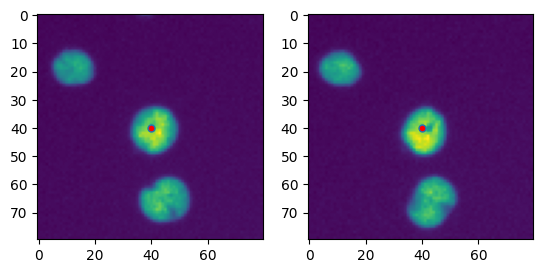

48
2
31 30


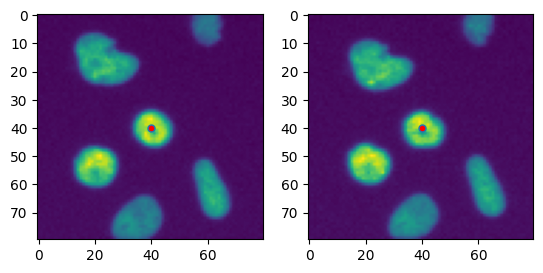

49
2
114 114


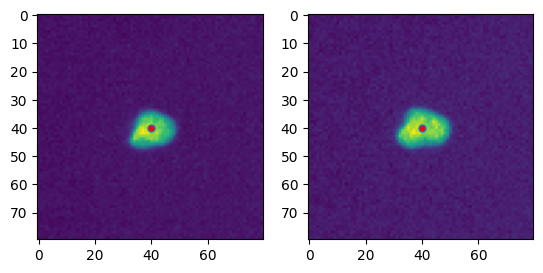

50
2
48 51


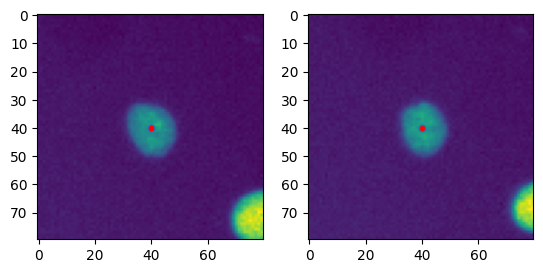

51
2
0 0


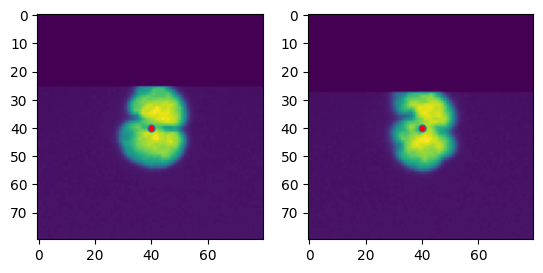

52
2
86 88


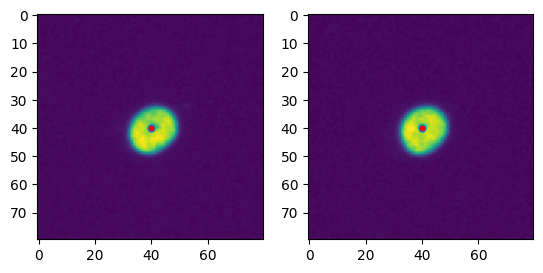

53
2
118 119


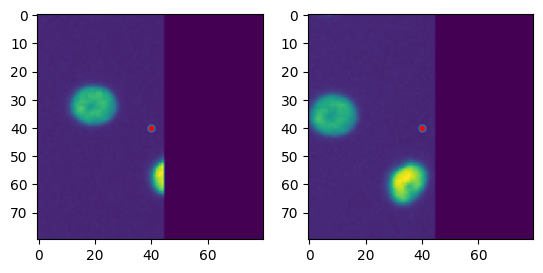

54
2
44 45


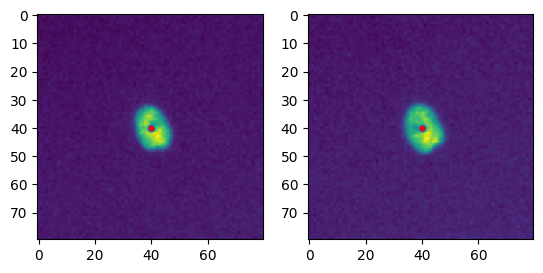

55
2
119 118


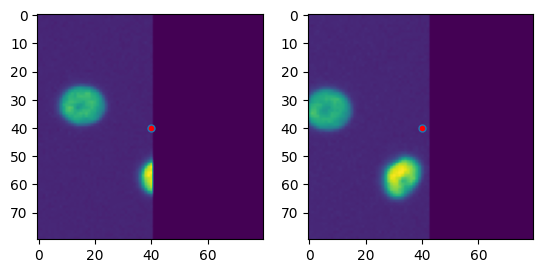

56
2
158 152


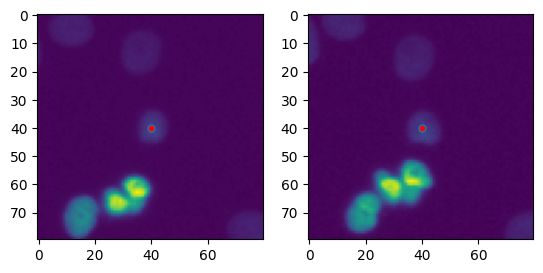

57
2
148 145


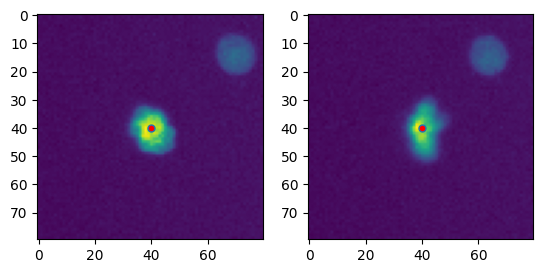

58
2
3 6


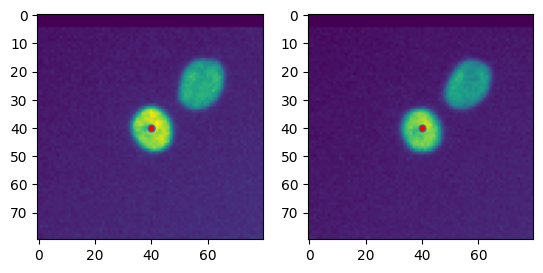

59
2
72 79


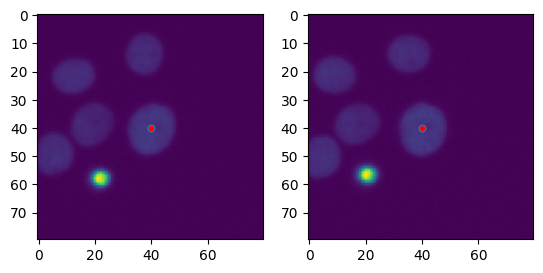

60
2
172 171


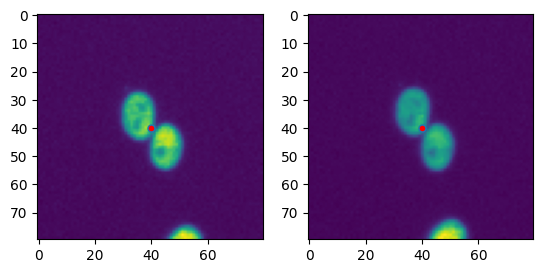

61
2
29 26


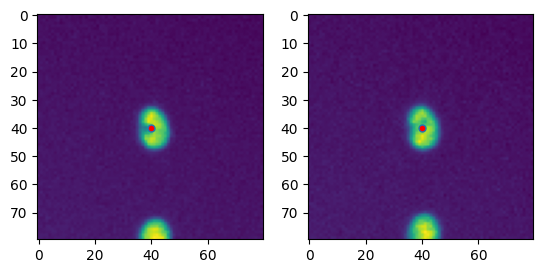

62
2
64 70


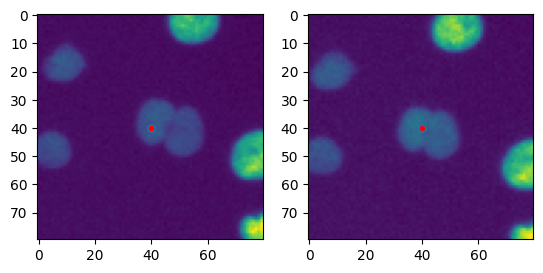

63
2
162 155


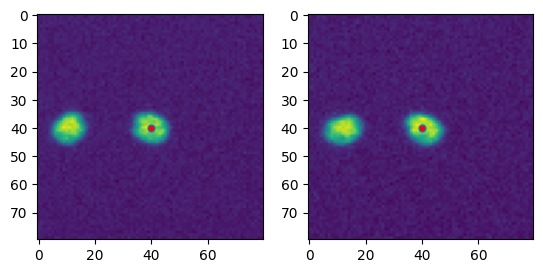

64
2
130 129


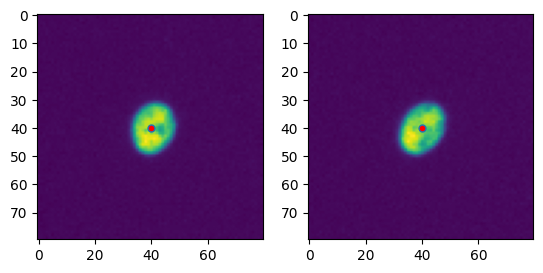

65
2
35 33


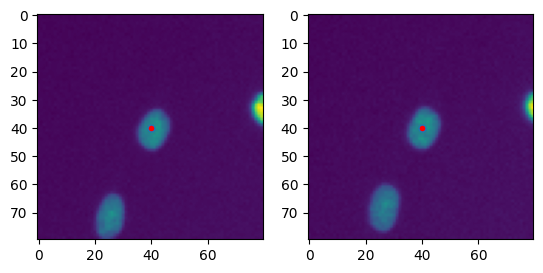

66
2
182 181


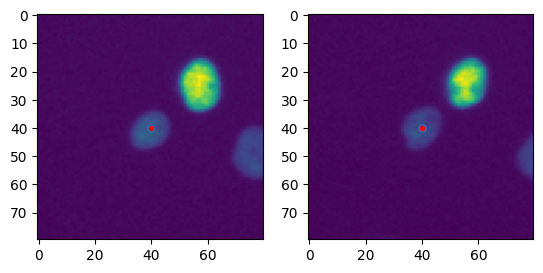

67
2
5 8


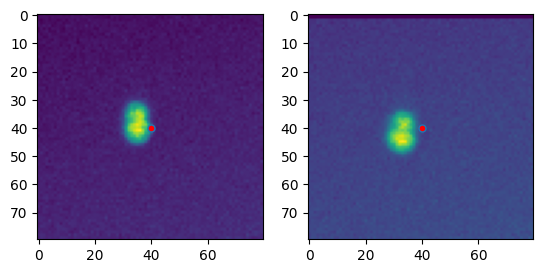

68
2
142 139


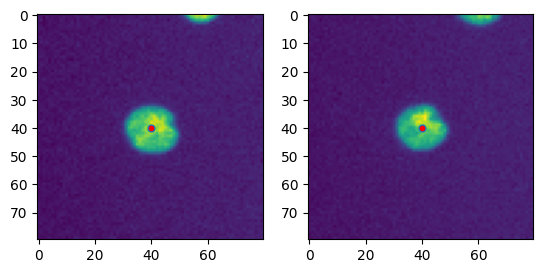

69
2
49 52


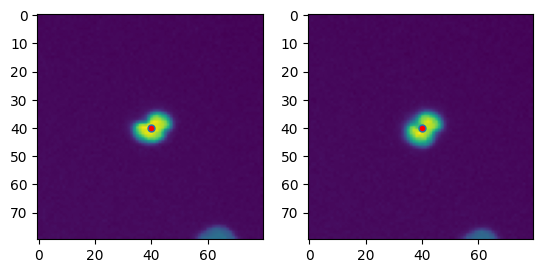

70
2
10 12


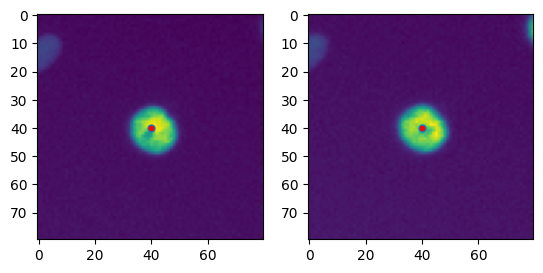

71
2
71 78


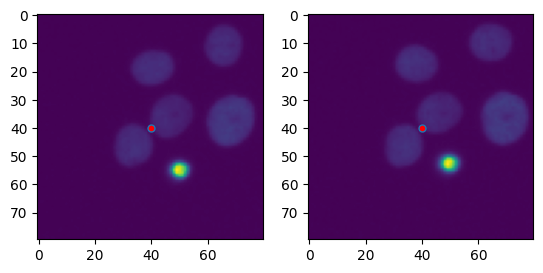

72
2
198 196


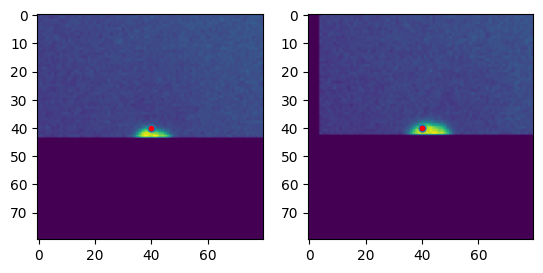

73
2
110 110


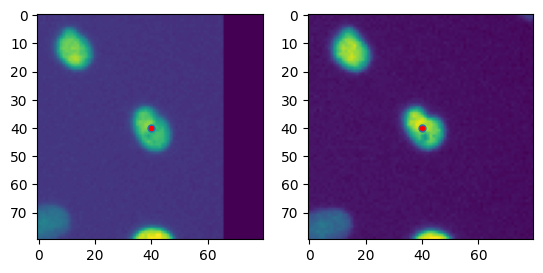

74
2
57 61


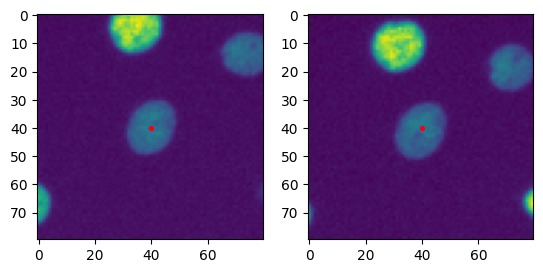

75
2
30 27


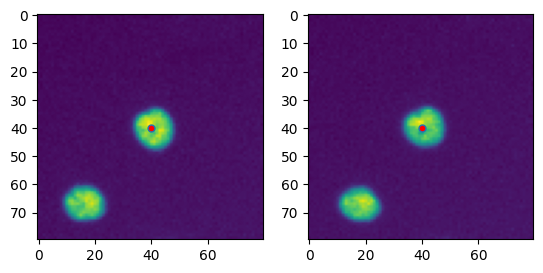

76
2
65 71


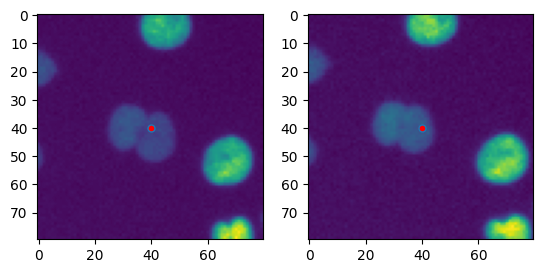

77
2
75 82


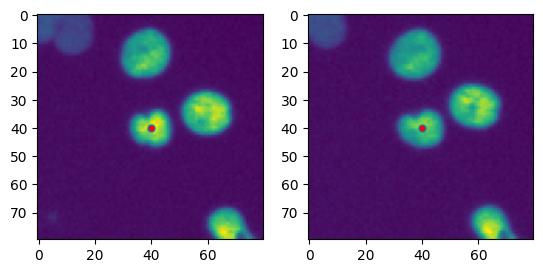

78
2
12 14


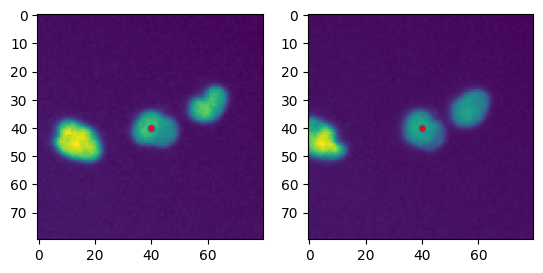

79
2
183 182


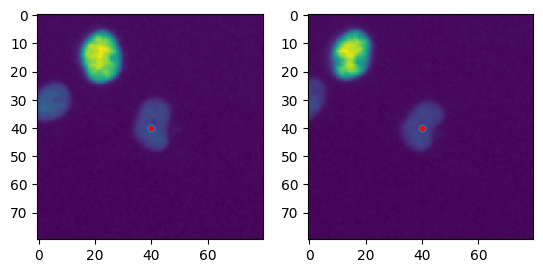

80
2
111 111


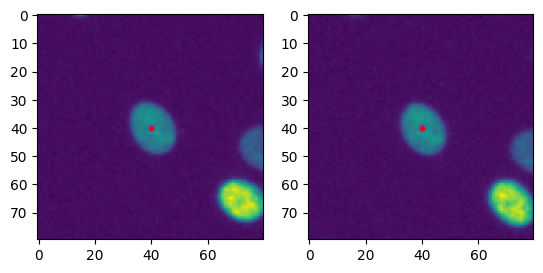

81
2
125 124


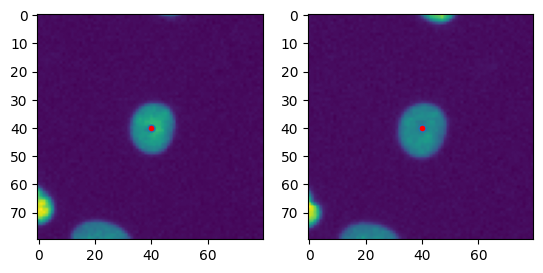

82
2
178 178


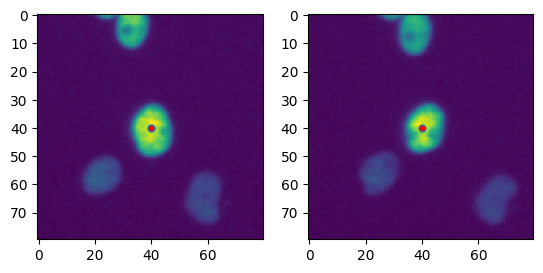

83
2
145 143


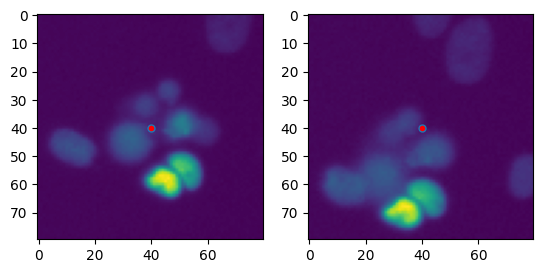

84
2
175 175


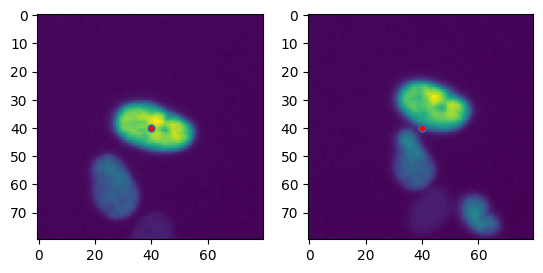

85
2
55 59


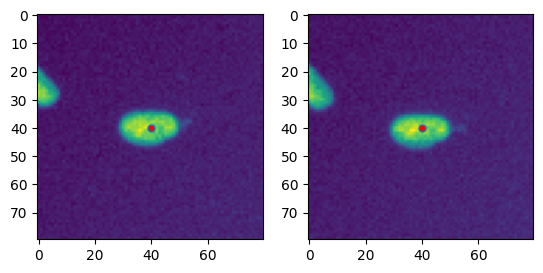

86
2
53 58


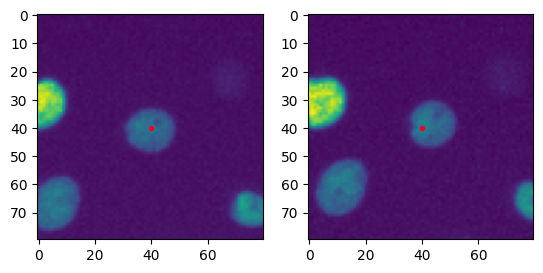

87
2
147 146


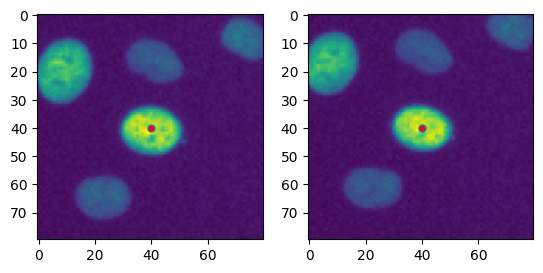

88
2
177 177


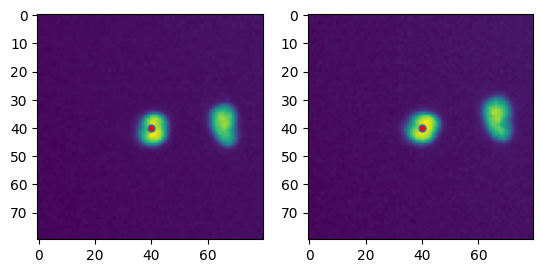

89
2
99 101


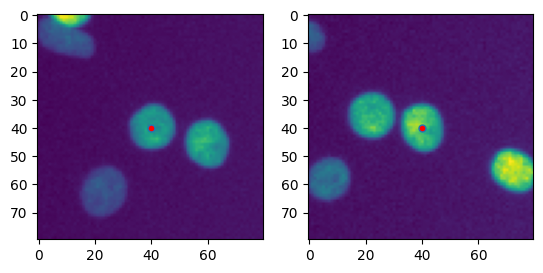

90
2
69 75


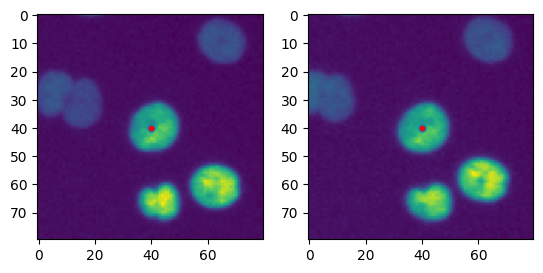

91
2
93 94


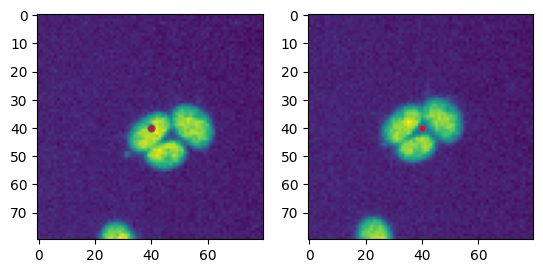

92
2
26 24


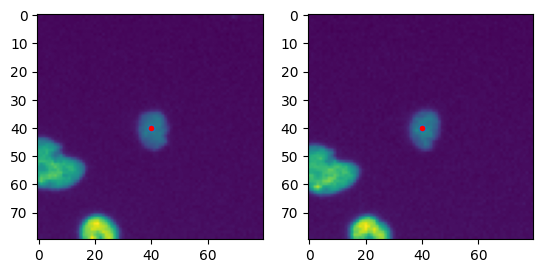

93
2
32 29


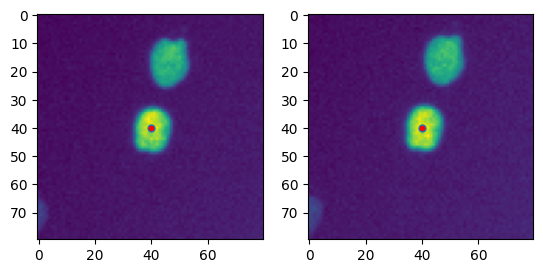

94
2
157 151


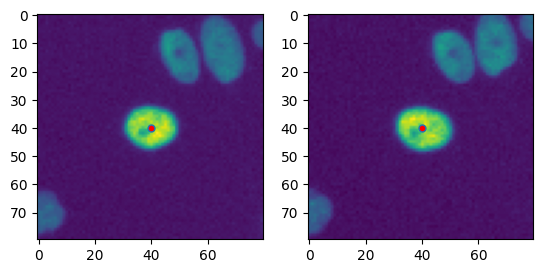

95
2
46 49


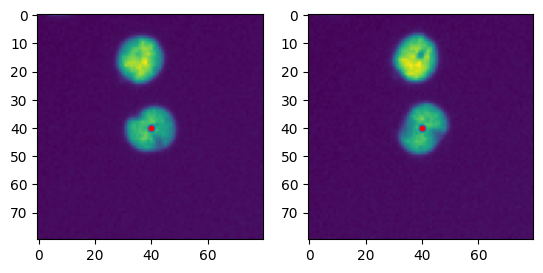

96
2
134 134


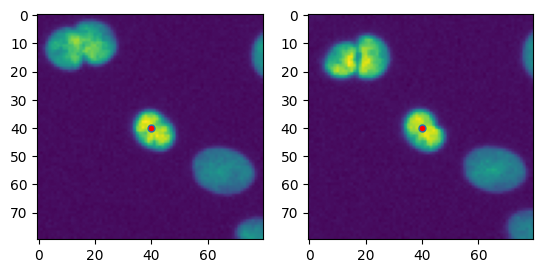

97
2
163 158


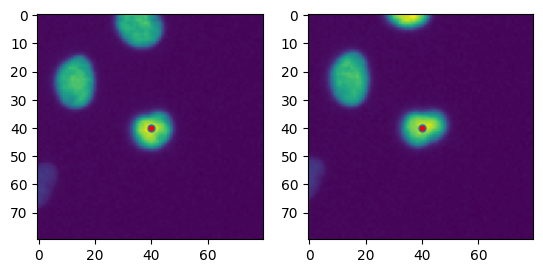

98
2
113 113


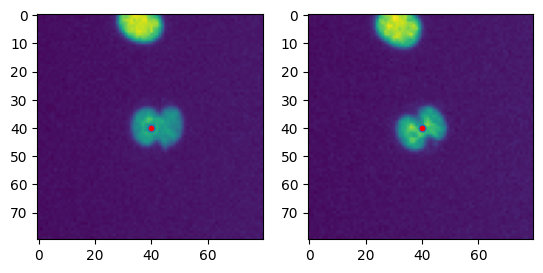

99
2
129 130


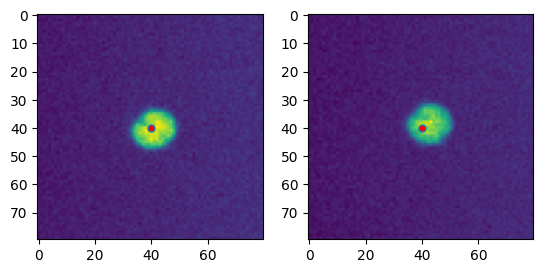

100
2
45 46


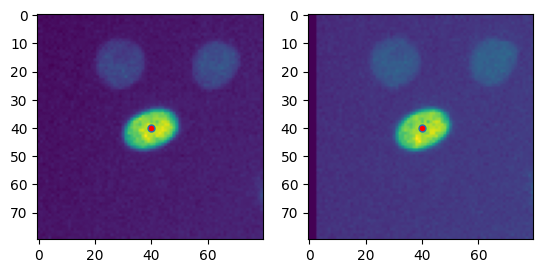

101
2
4 7


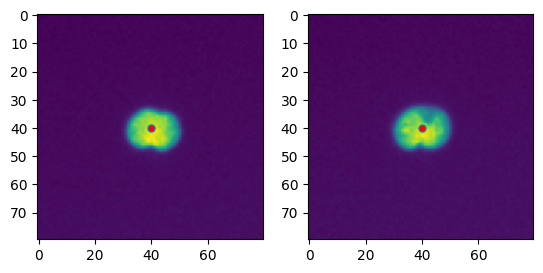

102
2
56 62


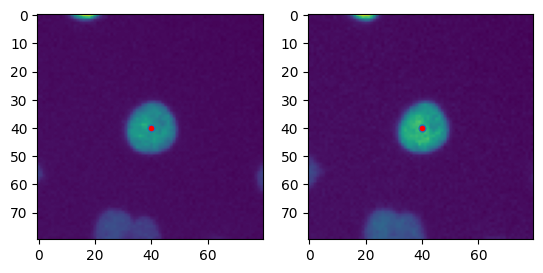

103
2
128 128


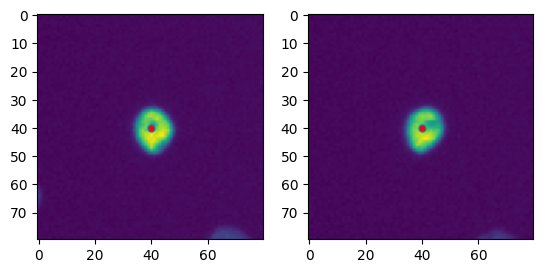

104
2
85 87


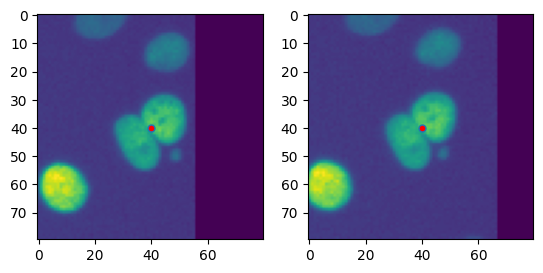

105
2
140 137


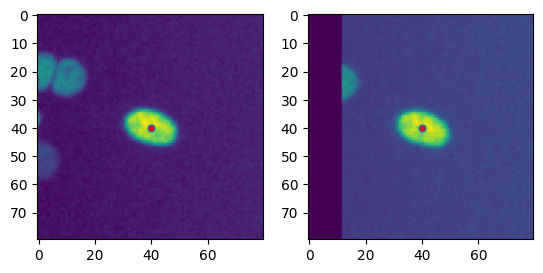

106
2
47 50


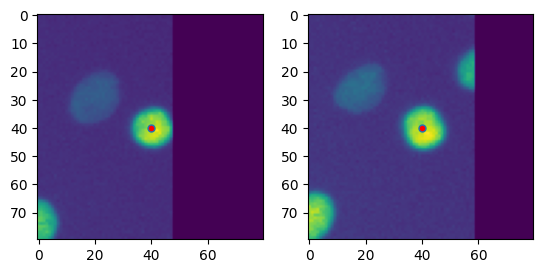

107
2
17 19


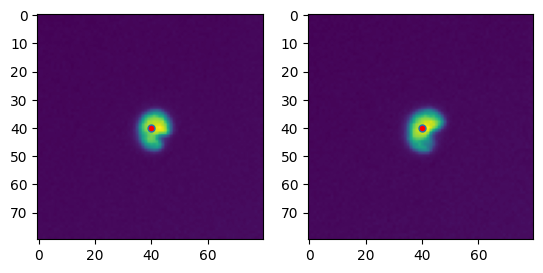

108
2
103 104


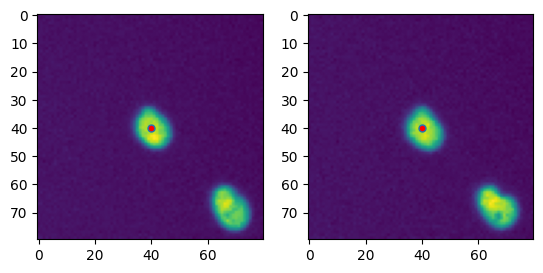

109
2
25 23


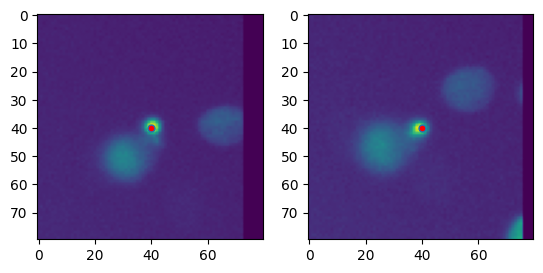

110
2
160 157


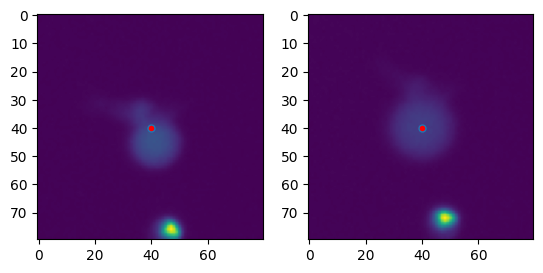

111
2
38 36


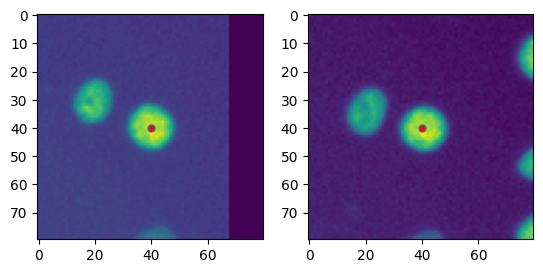

112
2
97 98


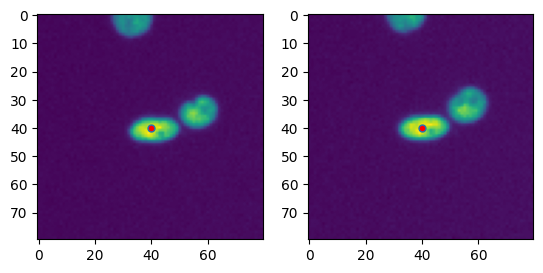

113
2
124 125


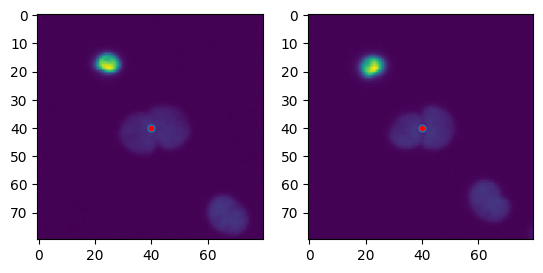

114
2
115 115


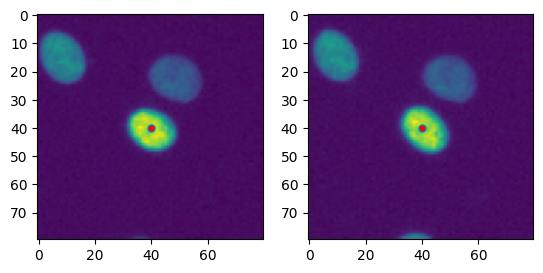

115
2
41 40


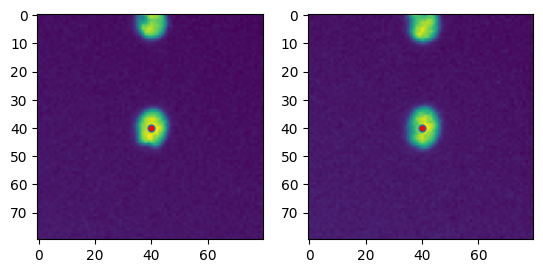

116
2
132 133


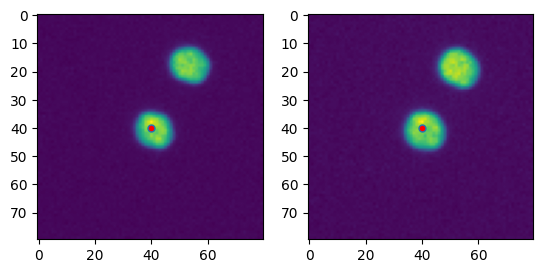

117
2
2 5


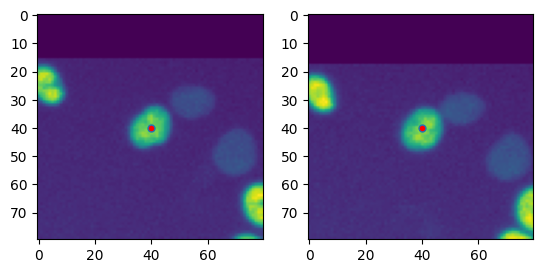

118
2
60 65


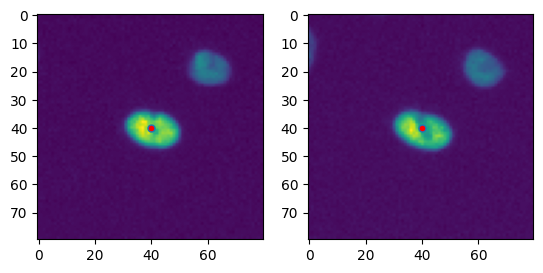

119
2
36 35


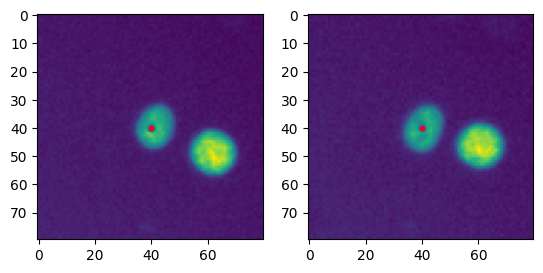

120
2
39 38


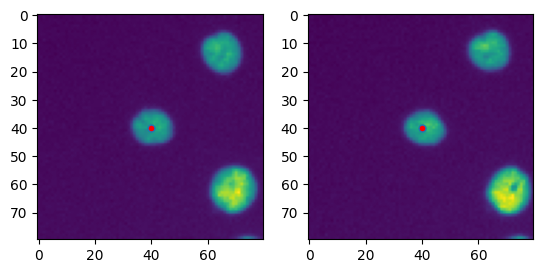

121
2
176 176


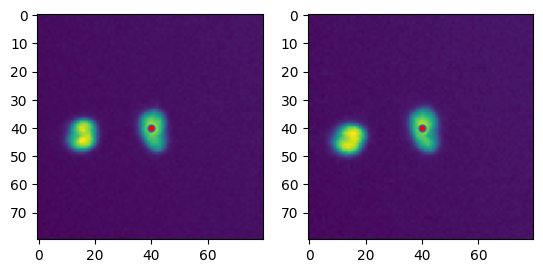

122
2
11 13


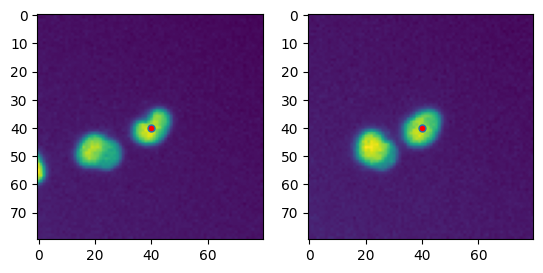

123
2
91 96


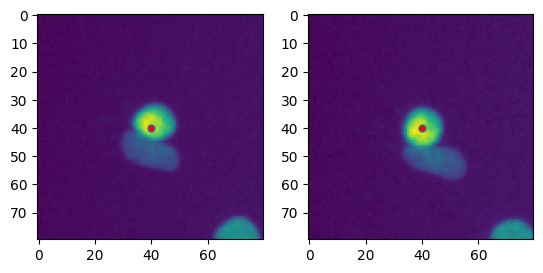

124
2
108 108


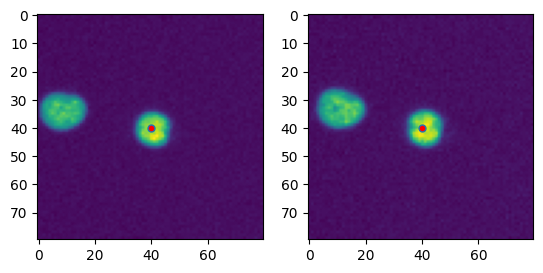

125
2
117 117


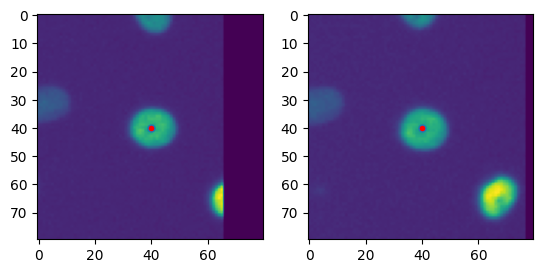

126
2
20 21


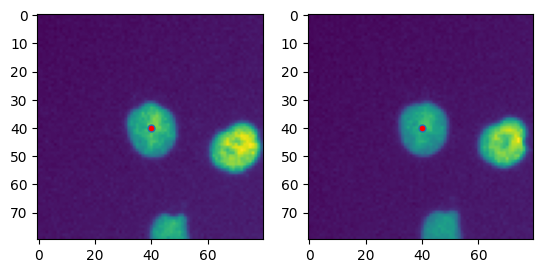

127
2
66 74


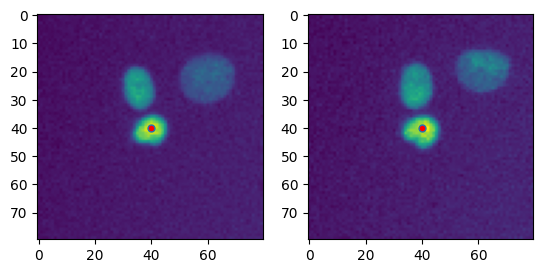

128
2
92 95


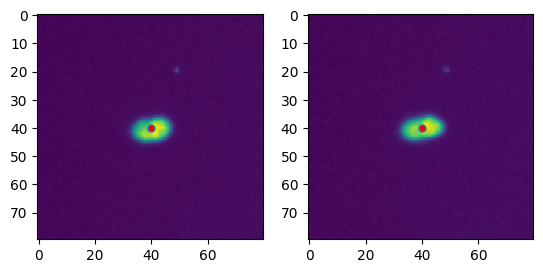

129
2
164 159


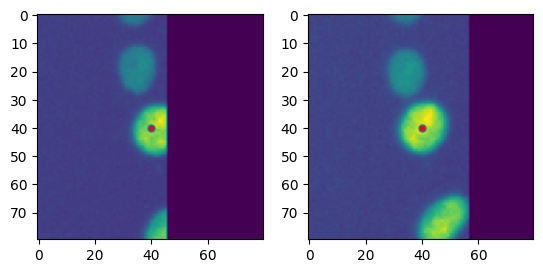

130
2
127 126


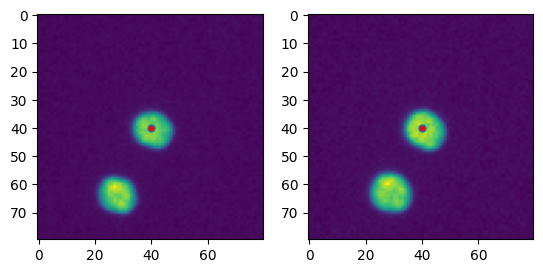

131
2
194 194


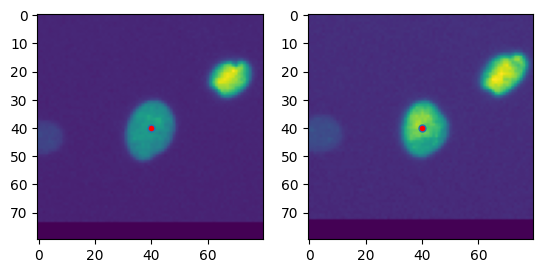

132
2
51 53


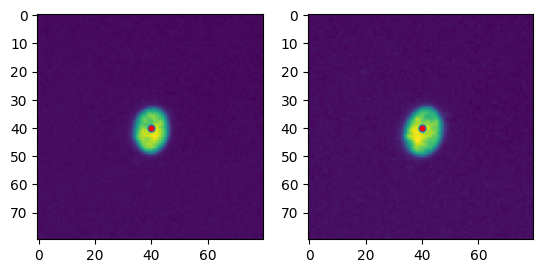

133
2
62 68


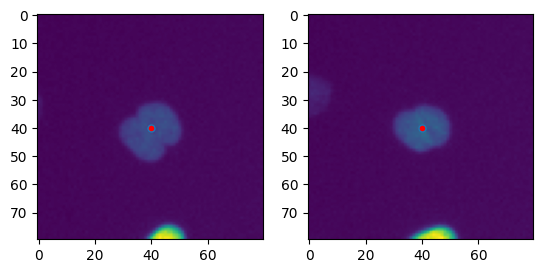

134
2
43 44


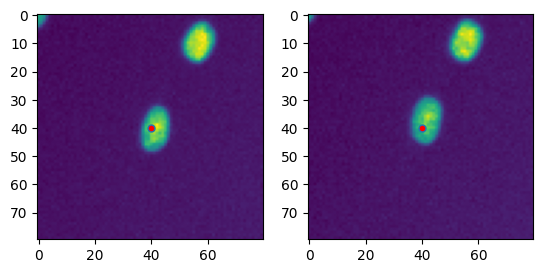

135
2
192 192


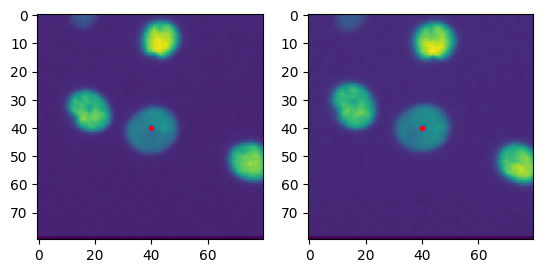

136
2
7 9


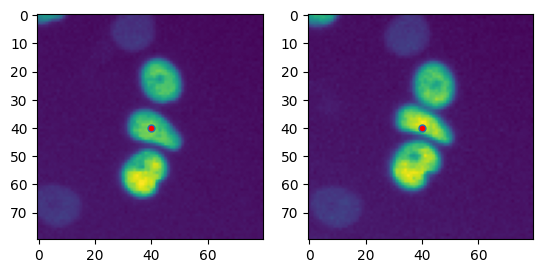

137
2
159 153


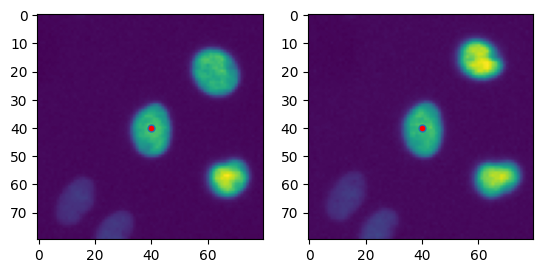

138
2
40 39


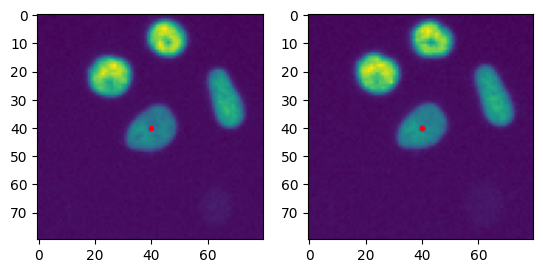

139
2
149 142


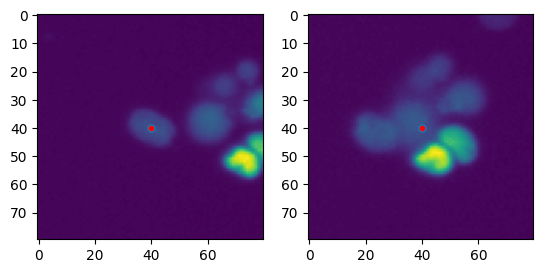

140
2
16 18


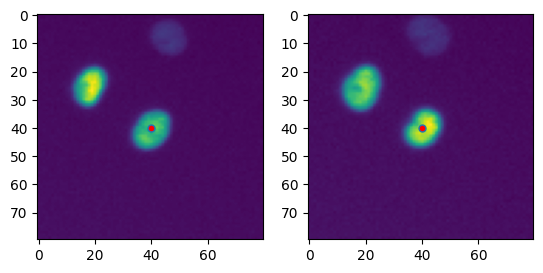

141
2
191 191


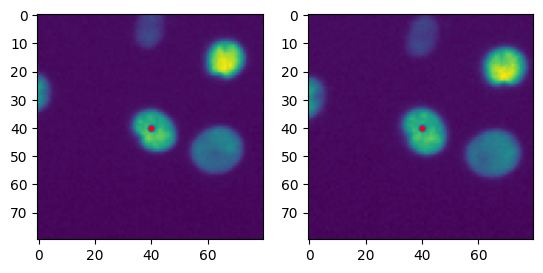

142
2
102 103


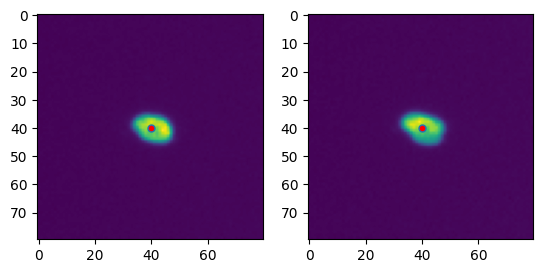

143
2
186 187


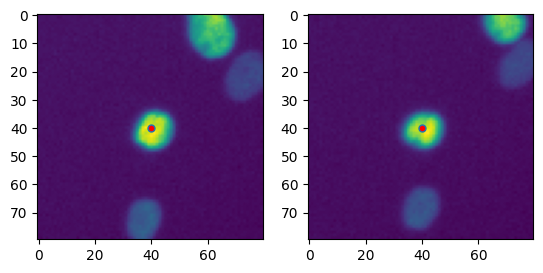

144
2
156 148


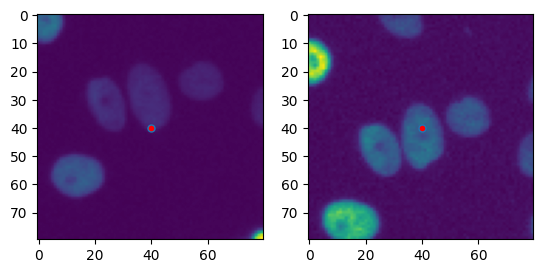

145
2
195 193


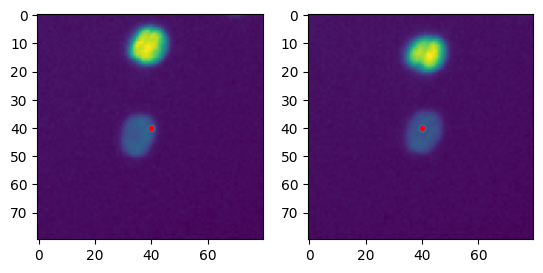

146
2
8 10


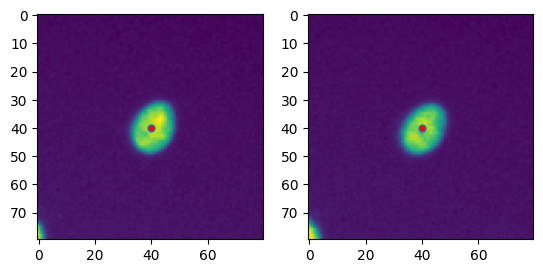

147
2
73 80


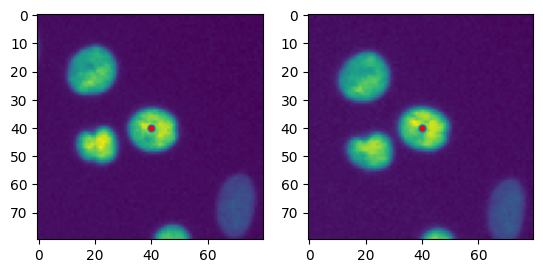

148
2
74 83


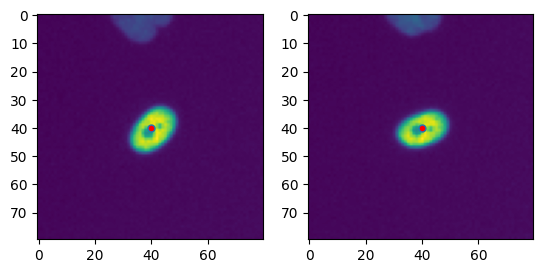

149
2
122 120


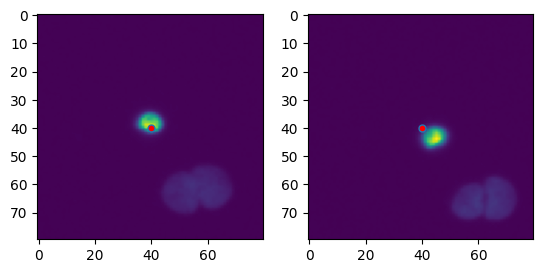

150
2
170 170


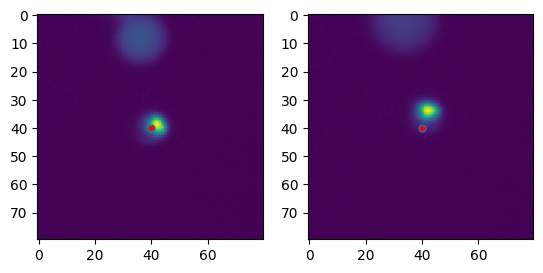

151
2
146 144


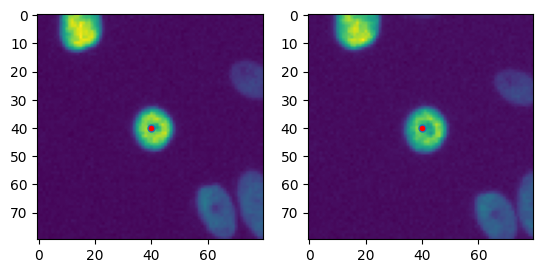

152
2
171 169


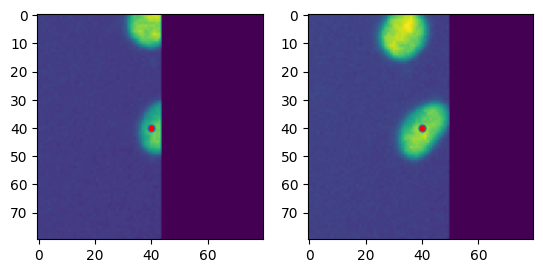

153
2
82 86


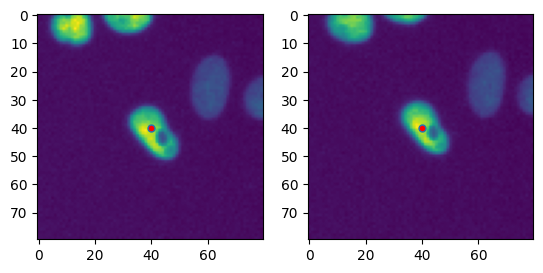

154
2
165 161


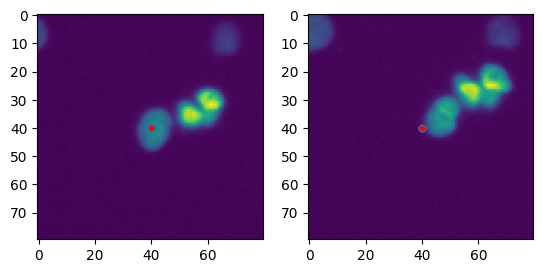

155
2
155 150


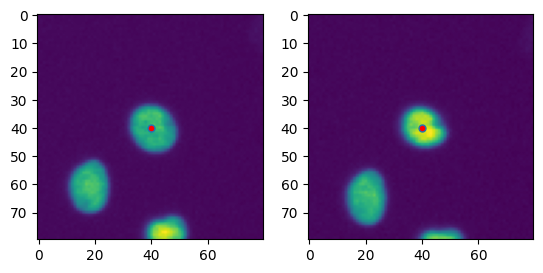

156
2
181 180


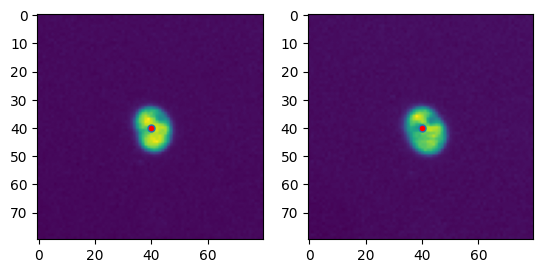

157
2
100 102


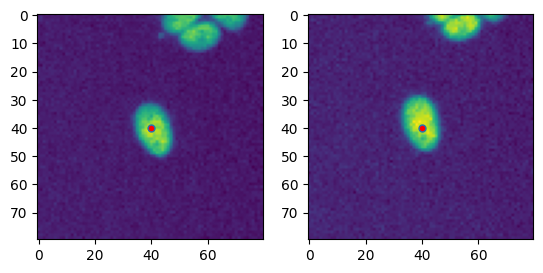

158
2
14 16


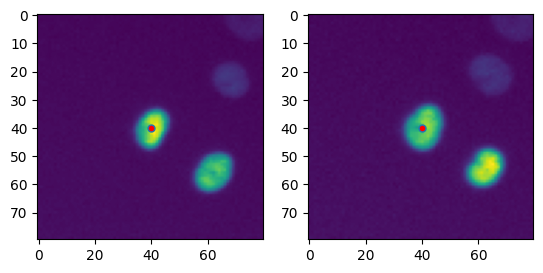

159
2
67 77


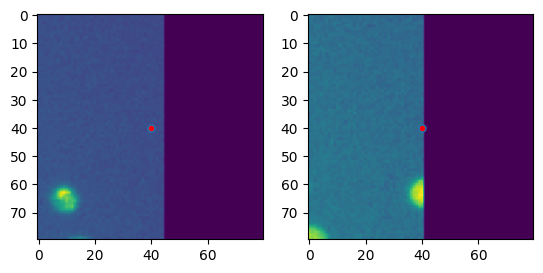

160
2
90 92


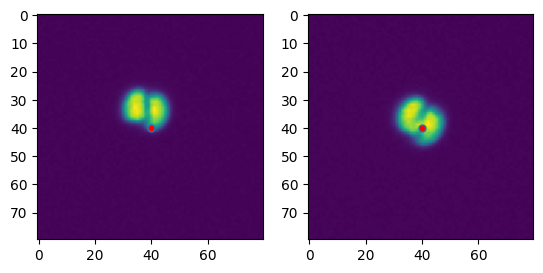

161
2
94 93


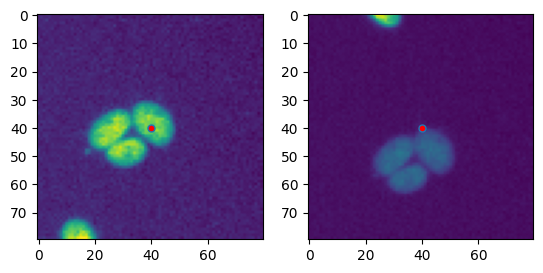

162
2
190 189


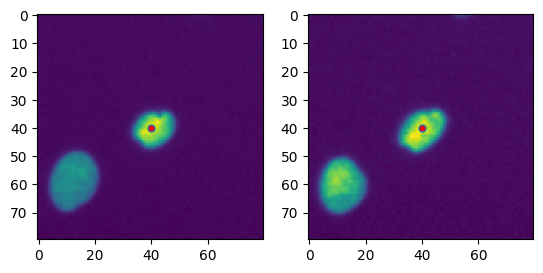

163
2
15 17


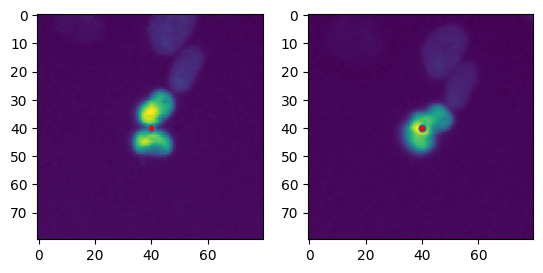

164
2
120 122


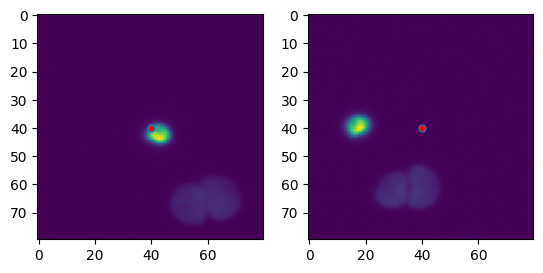

165
2
187 186


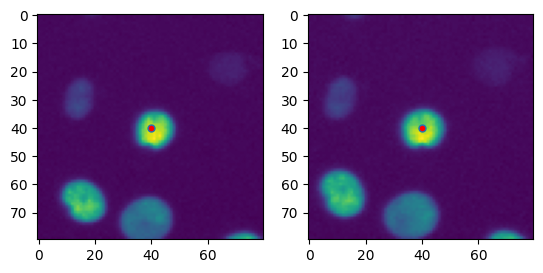

166
2
59 64


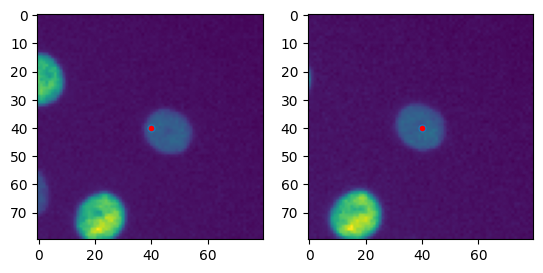

167
2
121 123


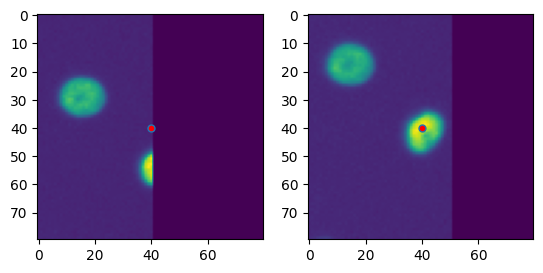

In [29]:
pad_val = 40
crop_val = 40
images = [np.pad(image,pad_val) for image in images_1059]
#merged_pairs = pair_up_multiple_imgs(instance_encFeats_cps[:10],centers_per_instance_mask[:10],radius=20)
for i in range(len(cell_pairs)):

    #if len(merged_pairs[i]) < 7:
    #    continue

    print(i)
    #print('distance:',distances_mk[i])
    #print('cos_sims',cos_sims_mk[i])
    print(len(cell_pairs[i]))
    print(cell_pairs[i][0],cell_pairs[i][1])
    for j in range(len(cell_pairs[i])+1):
        plt.subplot(1,len(cell_pairs[i]),j+1)
        x1 = centers_per_instance_mask[j][cell_pairs[i][j]][0]+crop_val
        y1 = centers_per_instance_mask[j][cell_pairs[i][j]][1]+crop_val
        plt.plot(crop_val,crop_val,marker="o", markersize=5, markerfacecolor="red")
        plt.imshow(images[j][y1-crop_val:y1+crop_val,x1-crop_val:x1+crop_val])
        
    plt.show()